![logo](../../../LogoLine_horizon_C3S.png)

# Suitability of satellite sea ice thickness data for studying climate change

Production date: 28-03-2025

Produced by: Timothy Williams, Nansen Environment and Remote Sensing Center


## 🌍 Use case: Assessing the suitability of satellite sea ice thickness data for studying climate change

## ❓ Quality assessment question
**How well do linear trends represent satellite-derived sea ice thickness data?**

## 📢 Quality assessment statement
```{admonition} These are the key outcomes of this assessment
:class: note

- We find that the usefullness of satellite sea ice thickness data for the purpose of studying climate change is limited, since the time series are relatively short and the sea ice thickness variable has quite a lot of interannual variability. Note that this conclusion does not apply to other applications of this data like validation of models (bearing in mind biases and uncertainties in the data).

- In limited regions, linear trends can explain a significant amount (greater than 0.5) of the variability in the satellite data, but even in those small regions the fits are not overly representative of the satellite estimates. That is, with the small number of years with data, how good the fits are is difficult to assess visually.
```

## 📋 Methodology
We consider the Level-3 [<span style="color:blue">sea ice thickness dataset</span>](https://cds.climate.copernicus.eu/datasets/satellite-sea-ice-thickness?tab=overview), which has two CDR (Climate Data Record) products:
- ENVISAT CDR (2002-2010)
- CryoSat-2 CDR (2010-2020)
CryoSat-2 also has an interim CDR (ICDR, covering 2020-2024) but we did not use this product in this notebook.

We fit linear trends to these two satellite products, and assess the goodness-of-fit using the $r^2$ and $p$-value statistics.
We do separate fits for each winter month (October-April), to all pixels with at least five years of data.
Maps of the mean, standard deviation and RMS (root mean sqare) uncertainty of the thickness, the fitted linear trend and the goodness-of-fit statistics are shown.
Note that the product uncertainty does not include biases and other errors. In the evaluations done ENVISAT was found to have a significant low bias while CryoSat-2 had a small positive bias (see the [<span style="color:blue">Product User Guide, p5)</span>](https://dast.copernicus-climate.eu/documents/satellite-sea-ice-thickness/level-3/v3-0/WP2-FDDP-2022-09_C3S2-Lot3_PUGS-of-v3.0-SeaIceThickness-products_v3.1_Final.pdf) for more details).

The "Analysis and results" section is structured as follows:

**[](satellite_satellite-sea-ice-thickness_trend-assessment_q01:section-1)**

**[](satellite_satellite-sea-ice-thickness_trend-assessment_q01:section-2)**

**[](satellite_satellite-sea-ice-thickness_trend-assessment_q01:section-3)**

## 📈 Analysis and results

(satellite_satellite-sea-ice-thickness_trend-assessment_q01:section-1)=
### 1. Parameters, requests and functions definition
- Define parameters and formulate requests for downloading with the EQC toolbox.
- Define functions to be applied to process and reduce the size of the downloaded data.
- Define functions to post-process and visualize the data.

#### 1.1 Import libraries
Define code to import the required libraries

In [1]:
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
from matplotlib.colors import BoundaryNorm
import xarray as xr
from c3s_eqc_automatic_quality_control import diagnostics, download, plot
import pandas as pd
import numpy as np
import cmocean
from collections import defaultdict
import calendar
from scipy.stats import linregress

plt.style.use("seaborn-v0_8-notebook")

#### 1.2 Set parameters
- Set the time range for ENVISAT data with `year_start_envisat` and `year_stop_envisat`
- Set the time range for CRYOSAT data with `year_start_cryosat` and `year_stop_cryosat`

In [2]:
year_start_envisat = 2002
year_stop_envisat = 2010

year_start_cryosat = 2010
year_stop_cryosat = 2020

globe = ccrs.Globe(semimajor_axis=6378137, inverse_flattening=298.257223563)
projection = ccrs.LambertAzimuthalEqualArea(central_latitude=90., globe=globe)

#### 1.3 Define requests
Define requests for downloading with the EQC toolbox.

In [3]:
collection_id = "satellite-sea-ice-thickness"

year_ranges = {
    "envisat": range(year_start_envisat, year_stop_envisat + 1),
    "cryosat_2": range(year_start_cryosat, year_stop_cryosat + 1),
}

requests = {}
for satellite, year_range in year_ranges.items():
    requests[satellite] = {
        "satellite": satellite,
        "version": "3_0",
        "cdr_type": "cdr",
        "variable": "all",
        "year": list(map(str, year_range)),
        "month": [f"{month:02d}" for month in [1, 2, 3, 4, 10, 11, 12]],
    }

chunks = {"year": 1}

#### 1.4 Post-processing functions
- `sort_time` sorts the dataset by month and year.
- `linregress_1d` fits a straight line to some training data (output and input).
- `get_stats` calculates some statistics over the year dimension (mean, standard deviation, RMS uncertainty) and also the coefficients of a linear fit (input is year) and goodness of fit statistics ($r^2$ value and $p$-value). It outputs a reduced dataset with no year dimension.
- `add_differences` adds the differences between the CryoSat-2 and ENVISAT statistics to the reduced dataset, and also reduces the spatial extent for better plotting.

In [4]:
def sort_time(ds):
    ds = ds.assign_coords(year=ds['time.year'], month=ds['time.month'])
    ds = ds.set_index(time=['year', 'month']).unstack('time')
    new_months = [10, 11, 12, 1, 2, 3, 4]
    ds = ds.sel(month=new_months).rename({"month": "month_num"})
    ds = ds.assign_coords(month=('month_num', [calendar.month_name[m] for m in ds['month_num'].values]))
    ds = ds.swap_dims({'month_num': 'month'})
    return ds.drop_vars(["month_num"])


def linregress_1d(y, x, min_num_points=5):
    mask = np.isfinite(y)
    if np.sum(mask) < min_num_points:
        return np.nan, np.nan, np.nan, np.nan

    x_train = x[mask]
    y_train = y[mask]
    slope, intercept, _, p_value, _ = linregress(x_train, y_train)
    
    y_pred = slope * x_train + intercept
    mse = np.mean((y_train - y_pred) ** 2)
    var_y = np.var(y_train)
    r_squared = 1 - mse / var_y if var_y != 0 else np.nan

    return slope, intercept, r_squared, p_value

    
def get_stats(ds):

    # init    
    sit = ds["sea_ice_thickness"].load().copy(deep=True) # copy since apply_ufunc removes info from ds
    proj_name = sit.grid_mapping
    proj = xr.DataArray(attrs=ds[proj_name].attrs)
    data = {}

    # get SIT statistics and create dataset
    sit = sit.where(sit >= 0)
    data["mean_thickness"] = sit.mean(dim="year")
    data["std_thickness"] = sit.std(dim="year")
    unc2 = ds["uncertainty"] ** 2
    data["rms_uncertainty"] = np.sqrt(unc2.mean(dim="year"))
    data["num_valid_years"] = np.isfinite(sit).sum(dim="year")
    ds_reduced = xr.Dataset(data)
    del data

    # get linear fit of SIT vs year
    fit = xr.apply_ufunc(
        linregress_1d,
        sit,
        sit.year,
        input_core_dims=[['year'], ['year']],
        output_core_dims=[[], [], [], []],
        vectorize=True,
        dask='parallelized',
        dask_gufunc_kwargs=dict(allow_rechunk=True),
        output_dtypes=[float, float, float, float],
    )
    for name, da in zip(["linear_trend", "intercept_linear_fit", "r2", "p_value"], fit):
        ds_reduced[name] = da
    del fit
    ds_reduced[proj_name] = proj

    attrs = {
        "mean_thickness": {
            "standard_name": "mean_sea_ice_thickness",
            "long_name": "Mean of sea ice thickness",
            "units": "m",
        },
        "std_thickness": {
            "standard_name": "standard_deviation_of_sea_ice_thickness",
            "long_name": "Standard deviation of sea ice thickness",
            "units": "m",
        },
        "rms_uncertainty": {
            "standard_name": "rms_sea_ice_thickness_uncertainty",
            "long_name": "RMS of sea ice thickness uncertainty",
            "units": "m",
        },
        "num_valid_years": {
            "standard_name": "number_of_valid_years",
            "long_name": "Number of valid years",
            "units": "1",
        },
        "linear_trend": {
            "standard_name": "slope_linear_fit_to_sea_ice_thickness",
            "long_name": "Slope from linear fit to sea ice thickness",
            "units": "m year$^{-1}$",
        },
        "intercept_linear_fit" : {
            "standard_name": "intercept_linear_fit_to_sea_ice_thickness",
            "long_name": "Intercept from linear fit to sea ice thickness",
            "units": "m",
        },
        "p_value": {
            "standard_name": "p-value for linear fit to sea ice thickness",
            "long_name": "p-value for linear fit to sea ice thickness",
            "units": "1",
        },
        "r2": {
            "standard_name": "r$^2$ value for linear fit to sea ice thickness",
            "long_name": "r$^2$ value for linear fit to sea ice thickness",
            "units": "1",
        },
    }
    for vname in attrs:
        ds_reduced[vname].attrs = attrs[vname] | {"grid_mapping": proj_name}
    return ds_reduced


def add_differences(ds):

    # remove areas with no data ever
    ds = ds.where(ds["mean_thickness"].notnull().compute(), drop=True)

    # ensure grid is contiguous after reducing area
    for d in ['xc', 'yc']:
        dx = abs(np.diff(ds[d]))
        bpi = dx > 1.5 * np.median(dx)
        if any(bpi):
            inds = np.arange(len(bpi), dtype=int)
            i = inds[bpi].min()
            ds = ds.isel({d: slice(0,i)})

    attrs = {
        "diff_mean_thickness": {
            "standard_name": "difference_in_mean_sea_ice_thickness",
            "long_name": "Difference in mean of sea ice thickness",
            "units": "m",
        },
        "diff_std_thickness": {
            "standard_name": "difference_in_std_sea_ice_thickness",
            "long_name": "Difference in standard deviation of sea ice thickness",
            "units": "m",
        },
        "diff_rms_uncertainty": {
            "standard_name": "difference_in_rms_sea_ice_thickness_uncertainty",
            "long_name": "Difference in RMS of sea ice thickness uncertainty",
            "units": "m",
        },
    }
    for dname in attrs:
        vname = dname[5:]
        da = ds[vname]
        proj_name = da.grid_mapping
        ds[dname] = da.sel(satellite="CryoSat-2") - da.sel(satellite="ENVISAT")
        ds[dname].attrs = attrs[dname] | {"grid_mapping": proj_name}
    ds[proj_name] = xr.DataArray(attrs=ds[proj_name].attrs)
    return ds

#### 1.5 Plotting functions
- `plot_maps` plots monthly maps for a given variable.
- `plot_maps_trends` plots maps of the trend with the goodness-of-fit statistices, the $r^2$ and $p$ values.
- `plot_maps_valid_years` plots monthly maps of the number of valid years for each satellite.
- `check_fit` plots time series of the satellite thickness and error bars to compare to the linear fits for selected points.
- `check_fit_envisat` selects the example points to check the fits to the ENVISAT data.
- `check_fit_cryosat2` selects the example points to check the fits to the CryoSat-2 data.

In [5]:
def plot_maps(da, projection, cbar_kwargs=None, **kwargs):
    kw = dict(
        projection=projection,
        robust=True,
        col="month",
    )
    if cbar_kwargs is None:
        cbar_kwargs = {}
    cbar_kwargs["pad"] = cbar_kwargs.get("pad", .05)
    cbar_kwargs["shrink"] = cbar_kwargs.get("shrink", .75)
    cbar_kwargs["extend"] = cbar_kwargs.get("extend", "both")
    
    if "satellite" in da.coords:
        kw["row"] = "satellite"
    facet_grid = plot.projected_map(da, cbar_kwargs=cbar_kwargs, **kw, **kwargs)
    facet_grid.set_titles(template="{value}")


def plot_maps_trends(ds, satellite, month, projection):

    ds_trend = ds.sel(month=month, satellite=satellite).drop_vars(["mean_thickness", "std_thickness", "rms_uncertainty", "satellite", "month"])
    kw_plot = dict(
        linear_trend = dict(cmap=cmocean.cm.balance, vmin=-.2, vmax=.2, extend="both"),
        r2 = dict(cmap="viridis", vmin=0, vmax=.5, extend="max"),
        p_value = dict(cmap="viridis", vmin=0.1, vmax=1, extend="min"),
    )
    cbar_kwargs=dict(pad=.1, shrink=.8)
    
    # Create plots
    n_vars = len(kw_plot)
    fig = plt.figure(figsize=(6 * n_vars, 4.5))
    axs = [fig.add_subplot(100 + 10 * n_vars + i + 1, projection=projection) for i in range(n_vars)]
    
    # Loop over variables
    for (vname, kw), ax in zip(kw_plot.items(), axs):
        da = ds_trend[vname]
        plot.projected_map(
            da, ax=ax,
            cbar_kwargs=cbar_kwargs | dict(extend=kw["extend"]),
            **{k: v for k,v in kw.items() if k != "extend"},
            projection=projection, show_stats=False)

    fig.suptitle(f"Linear fit to {satellite} SIT ({month})")
    fig.subplots_adjust(top=0.95, wspace=0.3)


def plot_maps_valid_years(ds, month_sets, projection):
    cmap = plt.get_cmap('tab20')
    bounds = np.arange(1, 10) # +2 to include the top edge
    norm = BoundaryNorm(boundaries=bounds, ncolors=cmap.N)
    cbar_kwargs = {"ticks": .5 + bounds[:-1], "format": '%i', 'extend': None}
    
    for months in month_sets:
        plot_maps(ds["num_valid_years"].sel(month=months), projection,
                  cbar_kwargs=cbar_kwargs, cmap=cmap, norm=norm, figsize=(12, 8))


def check_fit(ds_full, ds_reduced, points_ij, title, projection):

    # plot a map showing the point locations
    ax = plot.projected_map(
        ds_reduced["r2"].isel(xc=slice(135, 235), yc=slice(100,200)),
        projection=projection,
        cmap="viridis",
        vmin=0,
        vmax=.5,
        cbar_kwargs={"extend": "max"},
        show_stats=False,
    ).axes
    
    eps = 50e3 # distance between point and number [m]
    for n, (i,j) in enumerate(points_ij):
        ds_ij = ds_reduced.isel(xc=j, yc=i)
        x, y = [1e3 * ds_ij[d].values.item() for d in ('xc', 'yc')] # m
        ax.plot(x, y, 'or', markersize=5, zorder=10, transform=projection)
        ax.text(x + eps, y + eps, f'{n + 1}', color='r', fontsize=15)
    ax.set_title(title)
    plt.show()

    np = len(points_ij)
    fig, axs = plt.subplots(np, 1, figsize=(12, 4 * np), sharex=True)
    year = ds_full.year
    vnames = ["linear_trend", "intercept_linear_fit", "r2", "p_value"]
    for n, ((i,j), ax) in enumerate(zip(points_ij, axs.flatten())):

        # get the trend line
        ds_ij = ds_reduced.isel(xc=j, yc=i)
        x, y = [ds_ij[d].values.item() for d in ('xc', 'yc')]
        slope, intercept, r2, p_value = [ds_ij[v].values.item() for v in vnames]
        fit = intercept + slope * year

        # plot SIT time series and linear fit
        ds_ij = ds_full.sel(xc=x, yc=y)
        ax.errorbar(year, ds_ij["sea_ice_thickness"], ds_ij["uncertainty"],
                    fmt='o', capsize=5, capthick=1, label="Satellite data")
        ax.plot(year, fit, label="Linear fit")

        # labels
        ax.set_title(f"Point {n + 1}: $r^2={r2:.3f}$, $p={p_value:.3f}$")
        ax.set_ylabel("Sea ice thickness [m]")
        if n == np - 1:
            ax.set_xlabel("Year")
        ax.legend()
        fig.suptitle("Fits at selected points", fontsize=18, y=.94)#, x=.37, y=1.001)


def check_fit_envisat(datasets, ds_reduced, projection):
    sat = "ENVISAT"
    month = "February"
    points_ij = [
        (122,155), # high r^2 (.79)
        (119,151), # medium r^2 (.46)
        (120,188), # very low r^2 (.04)
    ]
    check_fit(
        datasets["envisat"].sel(month=month),
        ds_reduced.sel(month=month, satellite=sat),
        points_ij,
        f"{sat} ({month})",
        projection,
    )


def check_fit_cryosat2(datasets, ds_reduced, projection):
    sat = "CryoSat-2"
    month = "February"
    points_ij = [
        (128,158), # higher r^2 (.58)
        (155,200), # moderate r^2 (.37)
        (120,190), # low r^2 (.04)
    ]
    check_fit(
        datasets["cryosat_2"].sel(month=month),
        ds_reduced.sel(month=month, satellite=sat),
        points_ij,
        f"{sat}, {month}",
        projection,
    )

(satellite_satellite-sea-ice-thickness_trend-assessment_q01:section-2)=
### 2. Download and transform the data
This is where the data is downloaded, transformed using `monthly_weighted_linear_trend` and saved to disk by the EQC toolbox. If the code is rerun the transformed data is loaded from the disk.
The transformed data is then post-processed by `postprocess_dataset` after downloading or loading.

In [ ]:
datasets = {}
datasets_reduced = []
sat_names = {"envisat": "ENVISAT", "cryosat_2": "CryoSat-2"}
for satellite, request in requests.items():
    print(satellite)
    datasets[satellite] = sort_time(download.download_and_transform(collection_id, request))
    datasets_reduced += [get_stats(datasets[satellite]).expand_dims(satellite=[sat_names[satellite]])]
ds_reduced = add_differences(xr.concat(datasets_reduced, 'satellite'))
del datasets_reduced

(satellite_satellite-sea-ice-thickness_trend-assessment_q01:section-3)=
### 3. Results
In section [](satellite_satellite-sea-ice-thickness_trend-assessment_q01:section-3.1) we plot monthly maps showing the mean, variability and RMS uncertainty of sea ice thickness for the two satellites, and also plot the difference between the means for the two satellites to get an idea of the change in thickness going from the earlier to the later period.

In section [](satellite_satellite-sea-ice-thickness_trend-assessment_q01:section-3.2), we compute linear trends for the two satellites and test the goodness-of-fit of the linear fit.

(satellite_satellite-sea-ice-thickness_trend-assessment_q01:section-3.1)=
#### 3.1 Temporal mean and variability, and difference between satellite periods

Below we show the mean sea ice thickness for the two satellites ENVISAT (2002-2010) and CryoSat-2 (2010-2020), along with the difference between them.
The thickness in the CryoSat-2 product is higher at the coast north of Greenland and Canada and this extends to around the North Pole in earlier winter and a bit further later in the winter.
This pattern is consistent with the pattern in the ENVISAT thickness, but much of the area of interest is obscured by the large polar hole in that product.
However, looking at the difference in the means, there is a slight drop in thickness in the overlapping areas of thicker ice.
In general the mean thickness has dropped, with the exception of the area north of the Canadian archipelago (adjacent to the overlapping area of thicker ice) and in the Greenland Sea in the later winter months.

The two satellites have different biases (CryoSat-2 has a slight positive bias, while ENVISAT has a more significant negative bias) and accuracies so we should be be a little careful when comparing and trying to deduce temporal changes between them.
Given the satellite biases we can trust the reductions in thickness more than the increases in thickness. Moreover the increases in thickness also occur in regions of higher variability (plotted after the means and the difference in the means). Having said this we have used an 8-10 year averaging period so some of the variability will have been smoothed out.

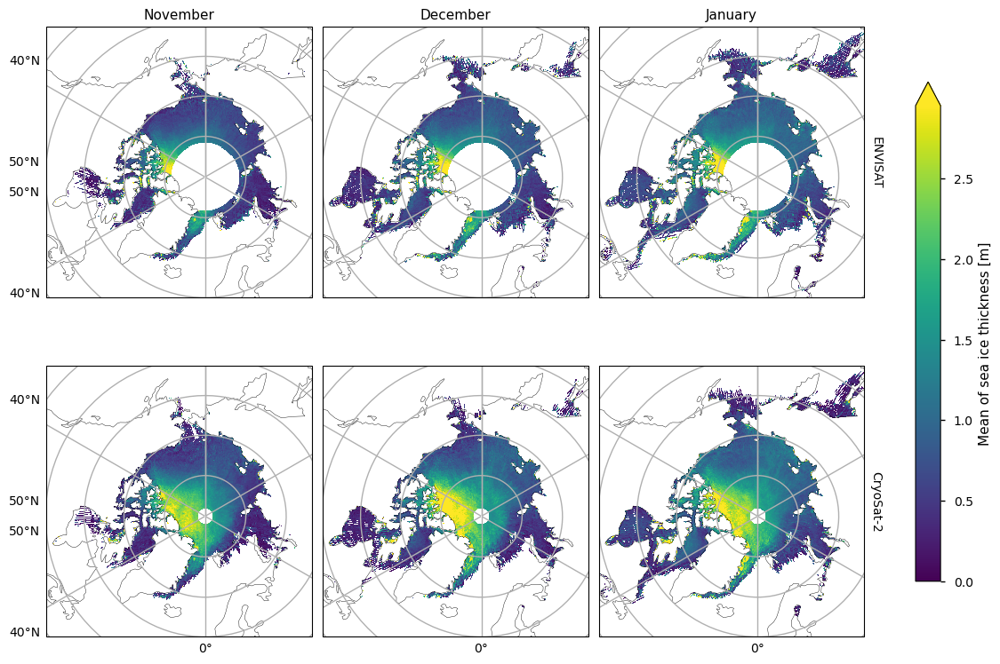

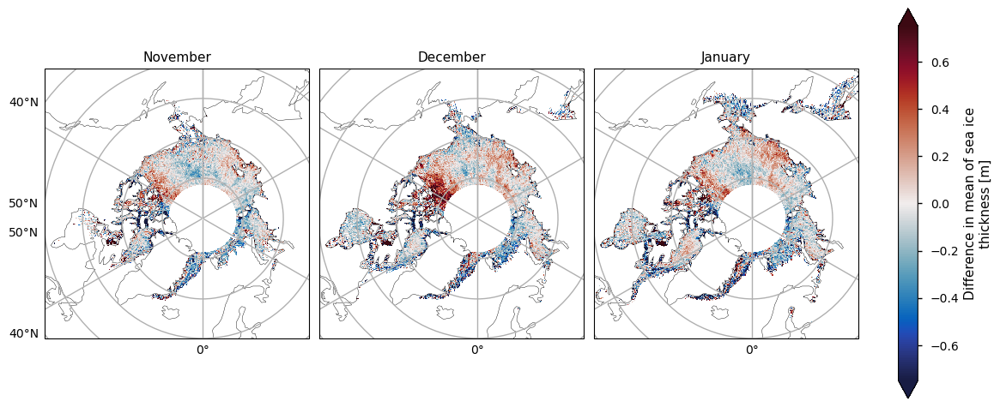

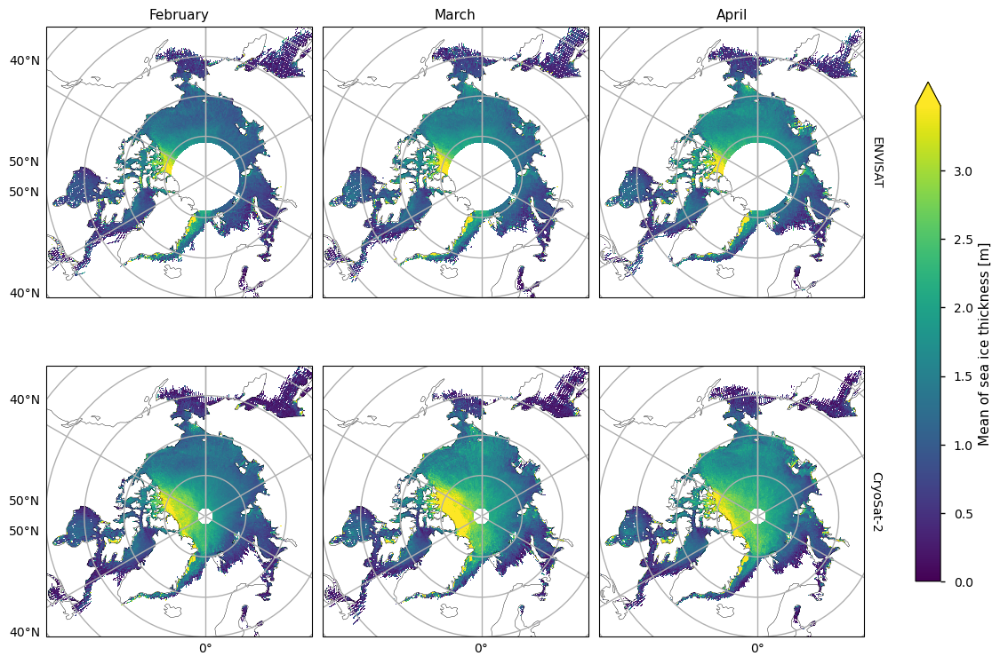

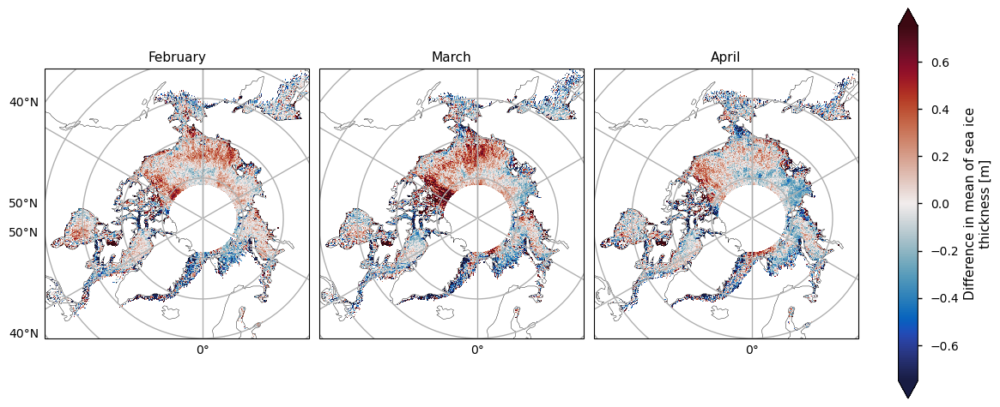

In [7]:
kw_mean = dict(vmin=0, cbar_kwargs={"extend": "max"})
kw_diff = dict(vmin=-.75, vmax=.75, cbar_kwargs={"pad": .04, "shrink": 1.25}, cmap=cmocean.cm.balance)
month_sets = [
    ["November", "December", "January"],
    ["February", "March", "April"],
]
for months in month_sets:
    plot_maps(ds_reduced["mean_thickness"].sel(month=months), projection, **kw_mean, figsize=(12, 8))
    plot_maps(ds_reduced["diff_mean_thickness"].sel(month=months), projection,**kw_diff, figsize=(12, 4))

Below we plot the standard deviations of the two satellite periods, and also the differences between them. For both the ENVISAT and the CryoSat-2 satellites, the variability is greatest in the areas with thicker and old ice, possibly since these areas are usually quite deformed due to ridging.
There is also high variability in the Greenland Sea, which is probably due in part to the highly dynamic nature of that area - the ice flows quite fast once it is exported through the Fram Strait. This exported ice can also be quite old and deformed with ridges which would also add to the variability. Looking at the differences, the variability has generally increased, with the exception of the area between the Beaufort Sea and the ENVISAT polar hole. This could be due to the higher resolution of the CryoSat-2 satellite, picking up smaller scale changes that ENVISAT cannot resolve, especially in regions of multi-year ice. CryoSat-2 also has less variability in the Labrador Sea Hudson bay from January to April, possibly since the ice there is generally more level, first-year ice.
Increased drift and deformation of the ice in latter years ([<span style="color:blue">Rampal et al, 2009</span>](https://doi.org/10.1029/2008JC005066)) may also be a factor.

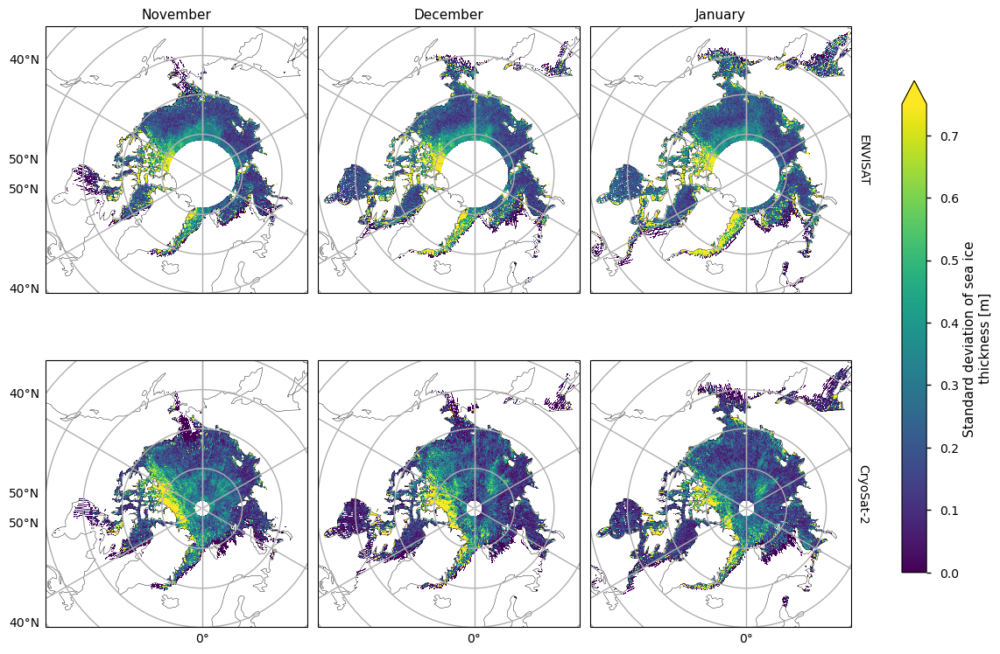

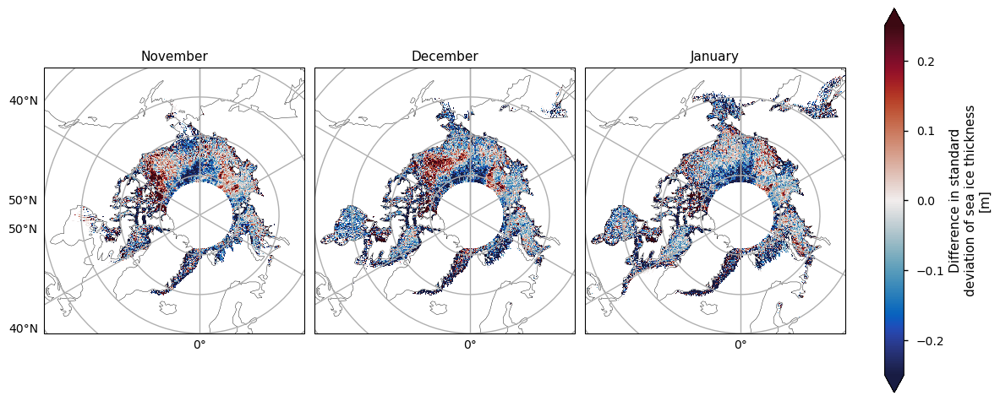

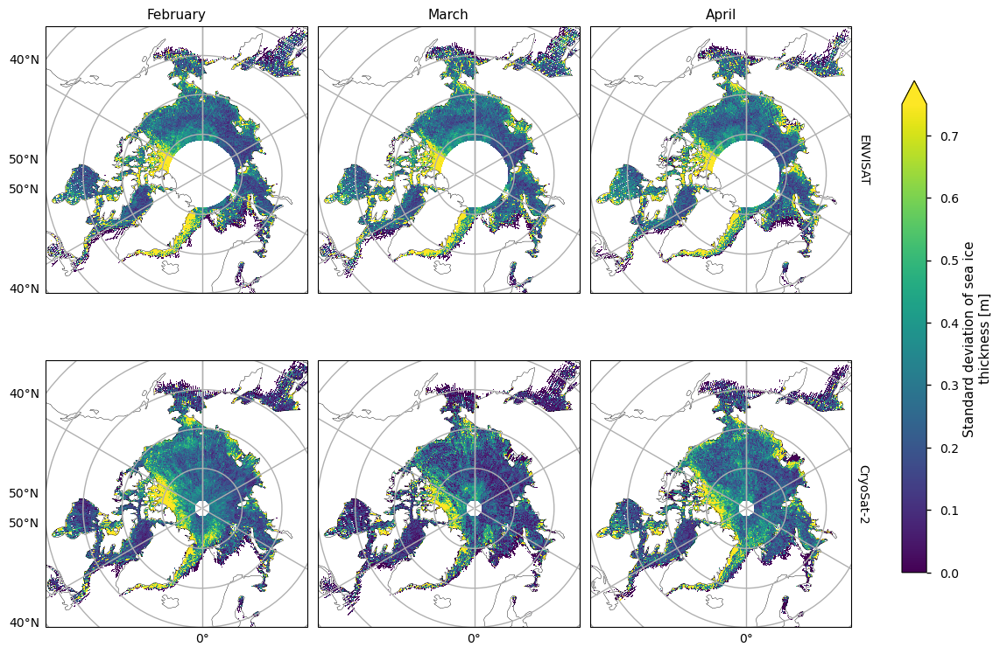

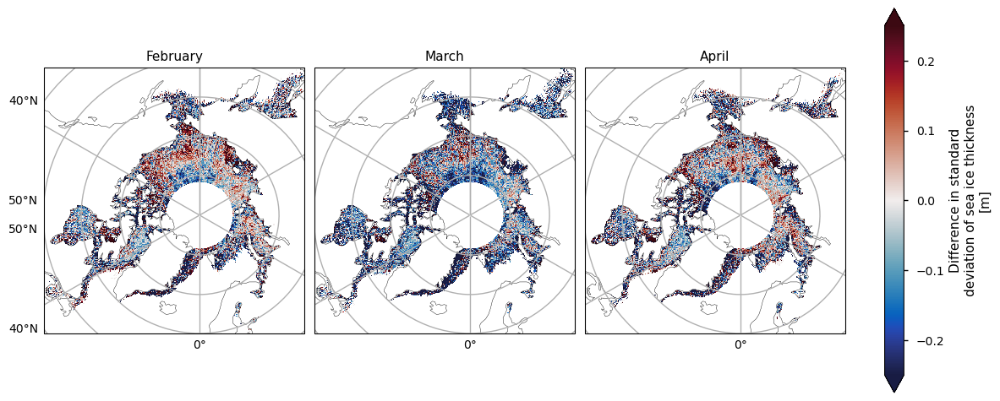

In [8]:
kw_std = dict(vmax=.75, cbar_kwargs={"extend": "max"})
kw_diff = dict(vmin=-.25, vmax=.25, cbar_kwargs={"pad": .04, "shrink": 1.25}, cmap=cmocean.cm.balance)
for months in month_sets:
    plot_maps(ds_reduced["std_thickness"].sel(month=months), projection, **kw_std, figsize=(12, 8))
    plot_maps(ds_reduced["diff_std_thickness"].sel(month=months), projection, **kw_diff, figsize=(12, 4))

Below we plot the RMS uncertainties of the two satellite periods, and also the differences between them. As with the variability, for both the ENVISAT and the CryoSat-2 satellites, the variability is greatest in the areas with thicker and old ice. It is also higher in coastal areas, possibly from a combination of more deformed ice, more uncertain snowfall and reference sea surface height, and radar signal contamination from land. Again like the variability, there is quite high uncertainty in the Greenland Sea. The uncertainty increases markedly as the winter progresses, possibly due to the ice becoming more deformed, and maybe higher errors in snow depth as more snow accumulates. In addition, once there starts to be surface melt melt ponds also start to interfere with the radar signal, which could also be increasing the April uncertainty.

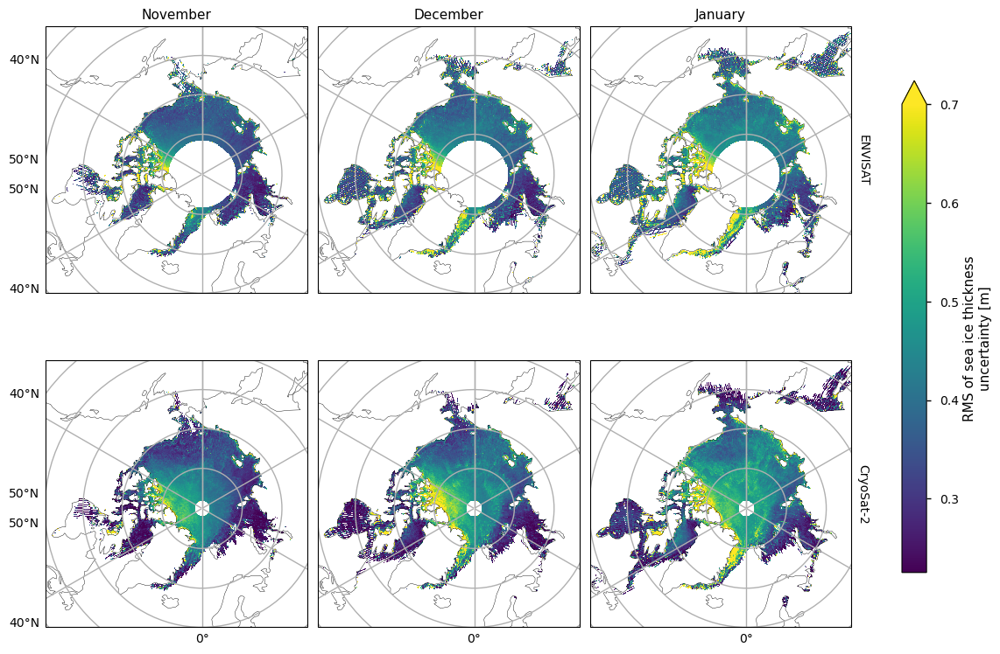

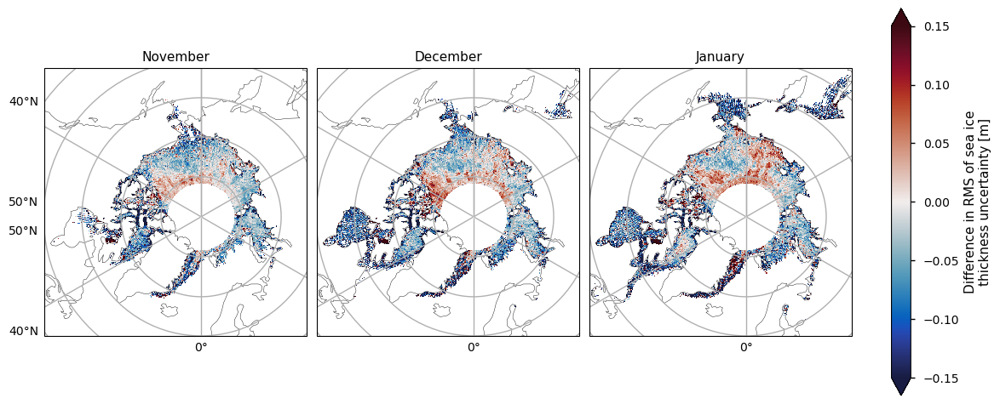

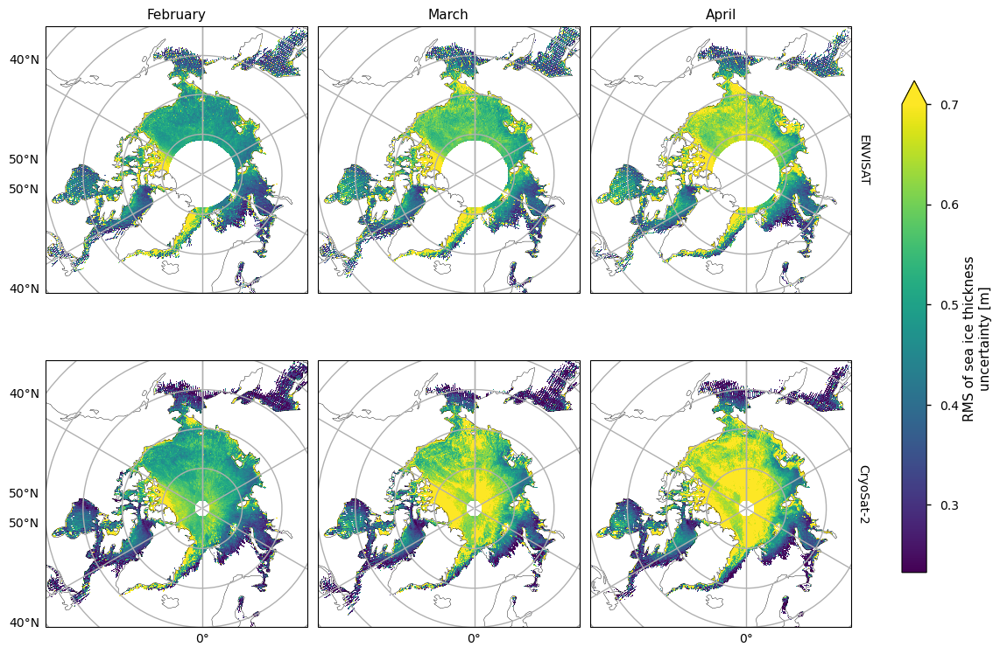

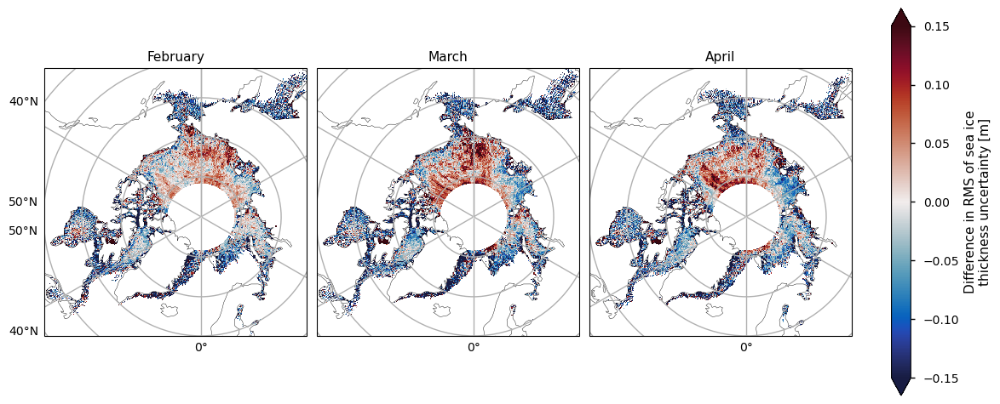

In [9]:
kw_unc = dict(vmax=.7, cbar_kwargs={"extend": "max"})
kw_diff = dict(vmin=-.15, vmax=.15, cbar_kwargs={"pad": .04, "shrink": 1.25}, cmap=cmocean.cm.balance)
for months in month_sets:
    plot_maps(ds_reduced["rms_uncertainty"].sel(month=months), projection, **kw_unc, figsize=(12, 8))
    plot_maps(ds_reduced["diff_rms_uncertainty"].sel(month=months), projection, **kw_diff, figsize=(12, 4))

Note that the uncertainties above do not include biases and other errors. In the evaluations done ENVISAT was found to have a significant low bias while CryoSat-2 had a small positive bias (see the [<span style="color:blue">Product User Guide, p5)</span>](https://dast.copernicus-climate.eu/documents/satellite-sea-ice-thickness/level-3/v3-0/WP2-FDDP-2022-09_C3S2-Lot3_PUGS-of-v3.0-SeaIceThickness-products_v3.1_Final.pdf) for more details).

(satellite_satellite-sea-ice-thickness_trend-assessment_q01:section-3.2)=
#### 3.2 Assessment of linear model for temporal variability

Before we show the trends and their goodness-of-fit statistics, we first plot maps showing the number of valid years for each pixel. The ENVISAT satellite generally has 8 valid years of data, with the exception of the marginal seas. CryoSat-2 has much less, possibly due to the smaller satellite footprint making it easier for the tracks to miss a given pixel. November/February/April mostly have 5/7/6 valid years, while other months have less than our minimum number of years (5). Hence we do not try to fit linear trends to October, December, January or March for the CryoSat-2 data.

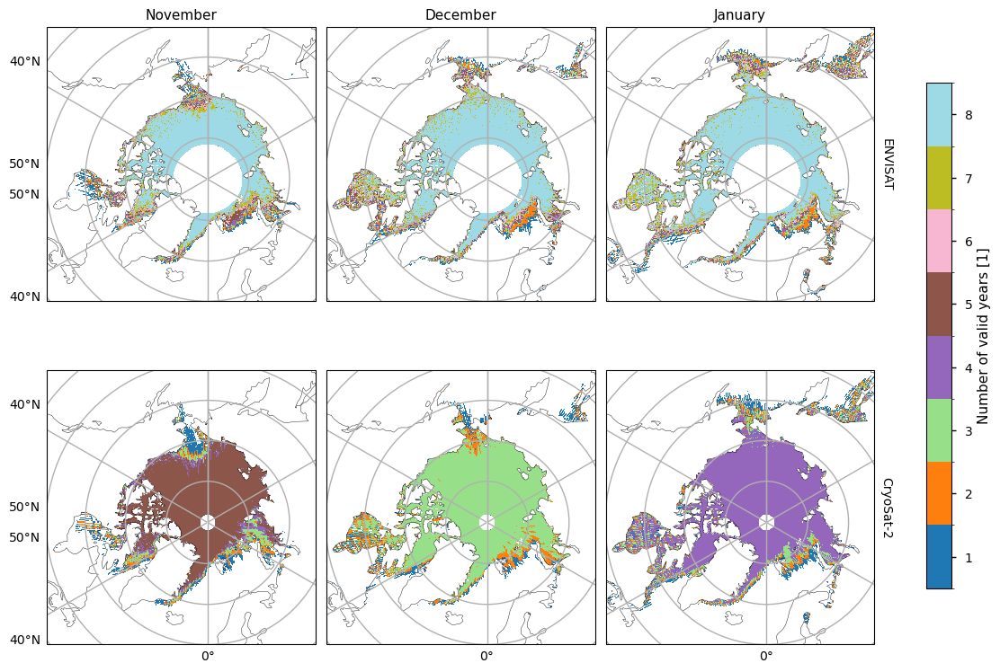

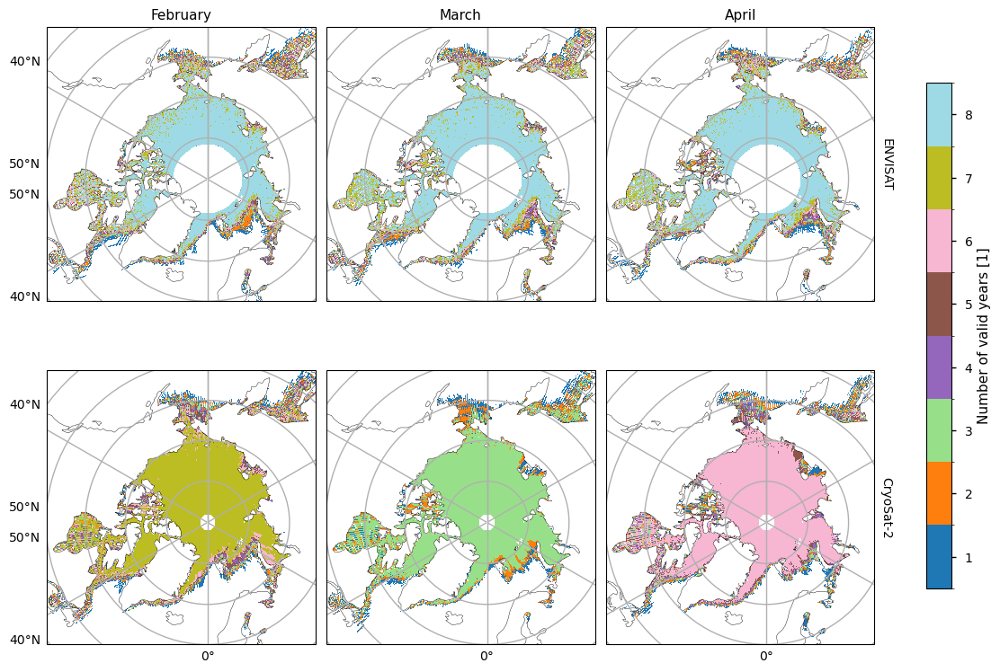

In [10]:
plot_maps_valid_years(ds_reduced, month_sets, projection)

For both satellite periods, we calcuated linear trends in sea ice thickness along with the goodness-of-fit statistices, the $r^2$ and $p$ values. The $r^2$ statistic measures the fraction of the variability explained by the linear trends and it is generally quite low, with the exception of a region between the Beaufort Sea and the polar hole in the ENVISAT data. This region also had the most significant reduction in sea ice variability. The $p$-value gives the probability of the data being explained by random variability around a zero trend. It tells a similar story to the $r^2$-value, in that it is generally quite high, with the exception of the same region in the ENVISAT data that had the higher r$^2$ value.

Below we plot the trend in the ENVISAT data for the month of February, along with the $r^2$ and $p$ values. The trend is about -10 cm/year in the region where the fit is acceptable. Other months are similar, in both the values and the region where the fit is acceptable. However, in general the linear fit to this data is explaining very little of the temporal variability.

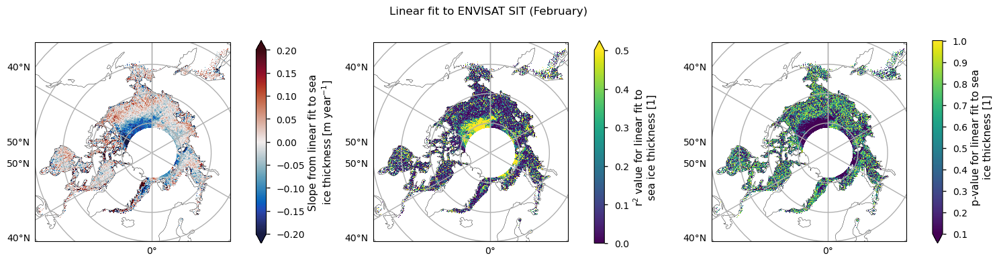

In [11]:
plot_maps_trends(ds_reduced, "ENVISAT", "February", projection)

Below we show three examples of the linear fits, at the positions shown on the map.

The first point has a high value of $r^2$ (0.79), and the fit is passing through all the error bars. It has a low $p$-value, so it is not well explained by random variations, but at the same time the behaviour is more of a step function than a linear decrease.

The second point has a borderline value of $r^2$ (0.46) and $p$-value (6.6%), so it is starting to be more explained by random variations (a common threshold is 5%). Visually the fit is not very representative of the data, and maybe a step function would be a better fit.

The third point has a very low value of $r^2$ and a high $p$-value or a high probability of being explained by random variability. With the exception of the first and last points, this series looks more like an increase followed by a decrease.
This example also shows the limitation of having such a short time series, in that removing possible outliers would leave very little data to work with.

In summary, for the ENVISAT data the region where linear fits are explaining a large fraction of the variability (as measured by $r^2$) is quite small, and even in those places a linear fit is still not overly convincing visually. The low number of data points also makes it hard to judge the fits visually.

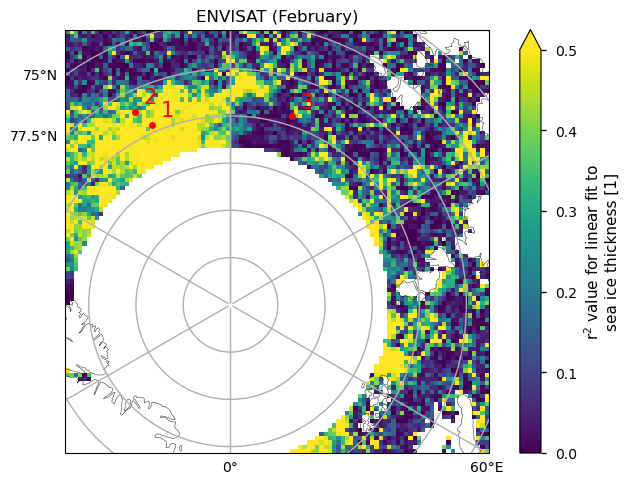

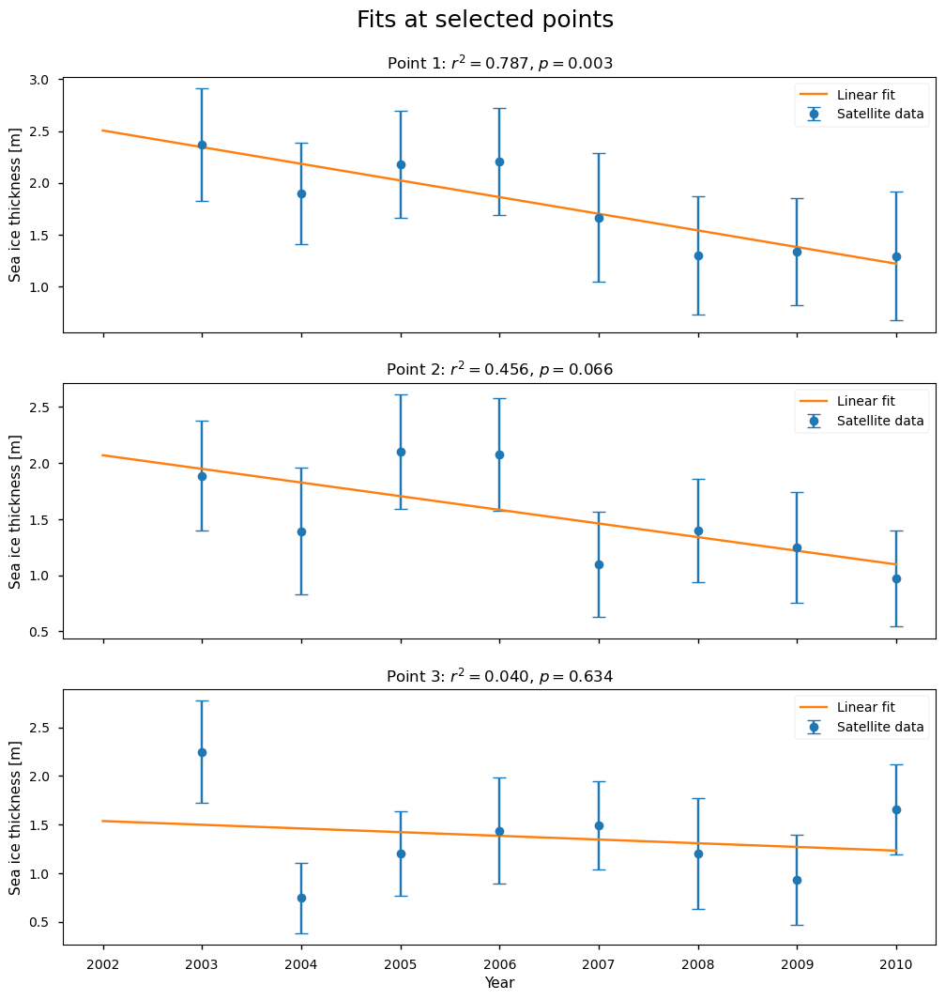

In [12]:
check_fit_envisat(datasets, ds_reduced, projection)

Below we plot the trend in the CryoSat-2 data for the months with enough data, along with the $r^2$ and $p$ values. The regions where $r^2$ is reaching 0.5 and the $p$ value is below 0.1 are quite small and less coherent than for the ENVISAT data.
In general we can again say that the linear fits to the thickness data are explaining very little of the temporal variability.
November has the largest area of higher $r^2$ but the thickness in that month is more uncertain for physical reasons (the ice is still quite dynamic; leads and melt ponds may still be refreezing; new ice has lower freeboard so it is harder to measure) so we do not concentrate on that one.
Since melting is starting in April its thickness is also very uncertain, so we will now focus on the month of February, which also has the highest number of valid years (7).

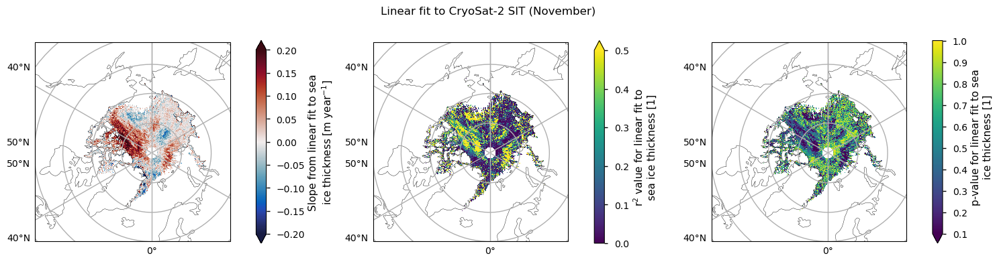

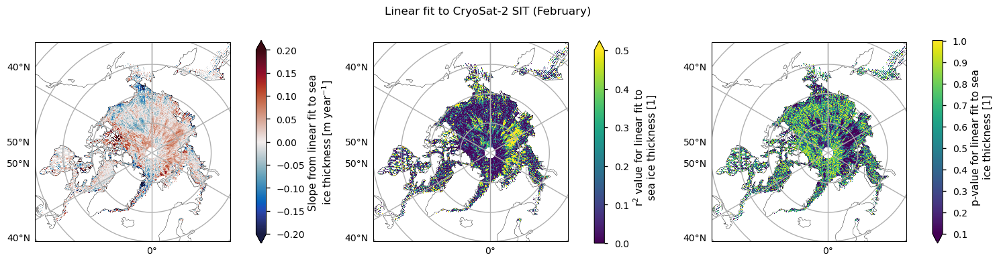

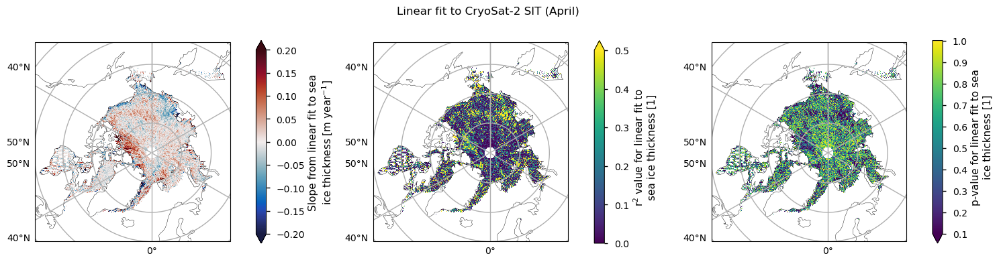

In [13]:
for month in ds_reduced.month.values:
    n = np.sum(np.isfinite(ds_reduced["linear_trend"].sel(satellite="CryoSat-2", month=month))).values.item()
    if n == 0:
        continue
    plot_maps_trends(ds_reduced, "CryoSat-2", month, projection)
    plt.show()

Below we show three examples of the linear fits to the CryoSat-2 data for the month of February, at the positions shown on the map.
The first point has a higher value of $r^2$ (0.58), and a borderline $p$-value of 4.6%, so it is starting to have a significant chance of being explained by random variations.
The second point has a lower value of $r^2$ (0.37), so it is explaining less than half of the variability, and the $p$-value has increased to 15%. 
The third point has a very low value of $r^2$ and a high $p$-value of 65%. While all of the fits are passing through all the error bars, it is difficult to decide visually if the fits are good ones due to the low number of points.

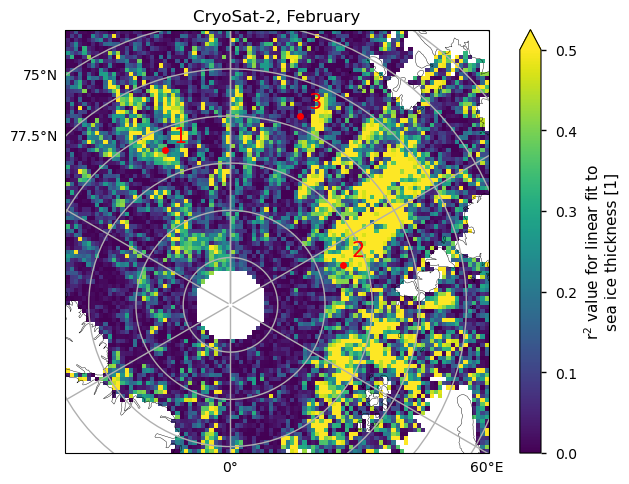

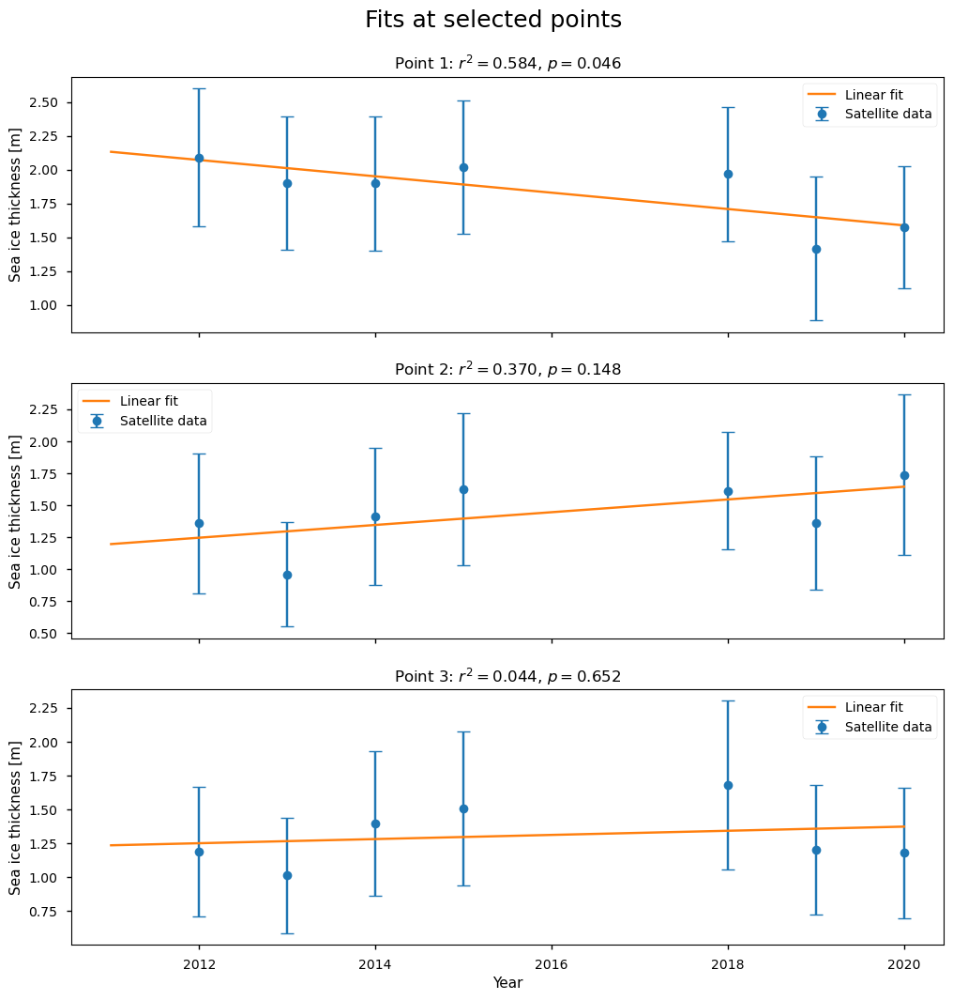

In [14]:
check_fit_cryosat2(datasets, ds_reduced, projection)

## ℹ️ If you want to know more

### Key resources

Introductory sea ice materials:
- [<span style="color:blue">Role of sea ice in the climate</span>](https://marine.copernicus.eu/explainers/why-ocean-important/sea-ice)
- [<span style="color:blue">Sea ice as an indicator of climate change</span>](https://climate.copernicus.eu/climate-indicators/sea-ice#)
- [<span style="color:blue">Observing sea ice with satellites</span>](https://www.metoffice.gov.uk/research/climate/cryosphere-oceans/sea-ice/measure)

Code libraries used:
* [<span style="color:blue">C3S EQC custom functions</span>](https://github.com/bopen/c3s-eqc-automatic-quality-control/tree/main/c3s_eqc_automatic_quality_control), `c3s_eqc_automatic_quality_control`,  prepared by [<span style="color:blue">B-Open</span>](https://www.bopen.eu/)

### References

1. Tilling, R. L., Ridout, A., & Shepherd, A. (2018). Estimating Arctic sea ice thickness and volume using CryoSat-2 radar altimeter data. Advances in Space Research, 62(6), 1203-1225, [<span style="color:blue"> https://doi.org/10.1016/j.asr.2017.10.051 </span>](https://doi.org/10.1016/j.asr.2017.10.051).

2. Müller, F. L., Paul, S., Hendricks, S., and Dettmering, D. (2023). Monitoring Arctic thin ice: a comparison between CryoSat-2 SAR altimetry data and MODIS thermal-infrared imagery. The Cryosphere, 17, 809–825, [<span style="color:blue"> https://doi.org/10.5194/tc-17-809-2023 </span>](https://doi.org/10.5194/tc-17-809-2023).

3. Rampal, P., J. Weiss, and D. Marsan (2009). Positive trend in the mean speed and deformation rate of Arctic sea ice, 1979–2007, J. Geophys. Res., 114, C05013, [<span style="color:blue"> https://doi.org/10.1029/2008JC005066 </span>](https://doi.org/10.1029/2008JC005066).